# COCO Dataset

In [2]:
import json
import sys
import getopt
import os
import glob
import shutil

from fastai import *
from fastai.vision import *

In [3]:
PATH = Path("/media/disk6tb/datasets/coco_2017")
ANNON_PATH = PATH/"annotations"
TRAIN_PATH = PATH/"train2017"
VAL_PATH = PATH/"val2017"

In [15]:
def load_test_val():
    images, lbl_bbox = get_annotations(ANNON_PATH/'instances_train2017.json')
    img2bbox = dict(zip(images, lbl_bbox))
    print("Total no of Train: %s"%(len(img2bbox)))
    
    images_val, lbl_bbox_val = get_annotations(ANNON_PATH/'instances_val2017.json')
    img2bbox_val = dict(zip(images_val, lbl_bbox_val))
    print("Total no of Val: %s"%(len(img2bbox_val)))
    
    img2bbox.update(img2bbox_val)
    print("Total img2bbox: %s"%(len(img2bbox)))
    return img2bbox

In [4]:
#annon_fn = ANNON_PATH/'instances_train2017.json'
#annon = None
#with annon_fn.open() as fp:
#    annon = json.loads(fp.read())
#tot = json.loads(open(ANNON_PATH/'instances_val2017.json').read())

In [16]:
img2bbox = load_test_val()
get_y_func = lambda o:img2bbox[o.name]

Total no of Train: 117266
Total no of Val: 4952
Total img2bbox: 122218


In [18]:
# Move images to a different folder that doesn't have any annotations.
def move_images_without_annotation():
    for src_dir, dest_dir in [(PATH/"train2017", PATH/"../coco_ignored/ignored/ignoredtest2017"), (PATH/"val2017", PATH/"../coco_ignored/ignored/ignoredval2017")]:
        total = 0
        print(src_dir)
        for img in src_dir.iterdir():
            if img.name not in img2bbox:
                shutil.move(str(img), dest_dir)
                total += 1
        print(total)
#move_images_without_annotation()

In [195]:
# data = (ObjectItemList.from_folder(PATH)
#         #Where are the images? -> in coco and its subfolders
#         .split_by_rand_pct()                          
#         #How to split in train/valid? -> randomly with the default 20% in valid
#         .label_from_func(get_y_func)
#         #How to find the labels? -> use get_y_func on the file name of the data
#         .transform(get_transforms(), tfm_y=True, size=224)
#         #Data augmentation? -> Standard transforms; also transform the label images
#         .databunch(bs=16, collate_fn=bb_pad_collate))   
#         #Finally we convert to a DataBunch, use a batch size of 16,
#         # and we use bb_pad_collate to collate the data into a mini-batch

In [159]:
data.show_batch(rows=5, ds_type=DatasetType.Valid, figsize=(32,32))

# Step 1: Largest item classifier

In [181]:
def get_large_images_ds():
    new_lbls = {}
    for img, segs in img2bbox.items():
        boxes = segs[0]
        areas = [np.product(np.array(box[-2:]) - np.array(box[:2])) for box in boxes]
        indx = np.argmax(areas)
        new_lbls[img] = segs[1][indx]
        
    for file in VAL_PATH.iterdir():
        new_lbls.pop(file.name)
    return new_lbls

In [182]:
img_largs_map = get_large_images_ds()

In [189]:
df = pd.DataFrame({'fn': list(img_largs_map.keys()), 'cat': list(img_largs_map.values())}, columns=['fn', 'cat'])
df.to_csv(PATH/"large_images_ds.csv", index=False)

In [190]:
get_y_func_large = lambda o:img_largs_map[o.name]

In [191]:
data_img = ImageDataBunch.from_csv(PATH, folder='train2017', csv_labels="large_images_ds.csv", size=224, ds_tfms=get_transforms())

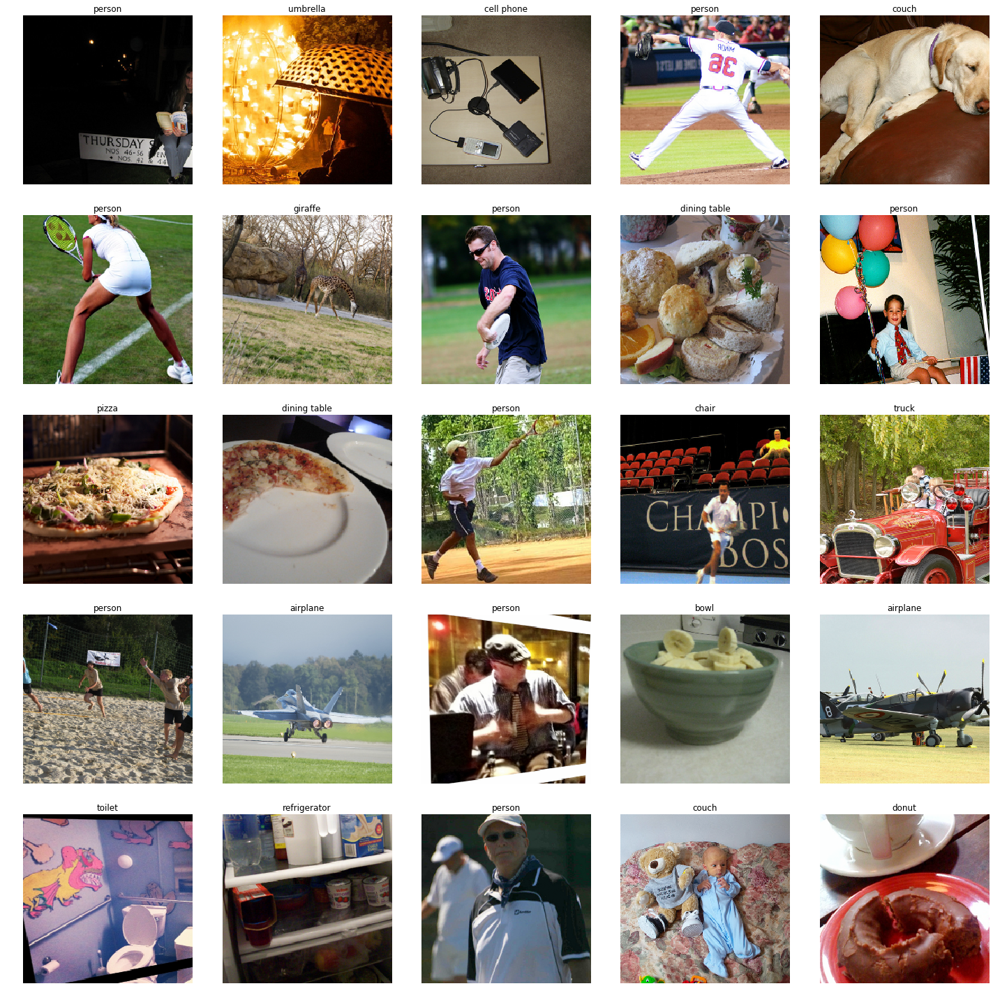

In [193]:
data_img.show_batch()

In [199]:
learn = cnn_learner(data_img, models.resnet50, metrics=accuracy)

In [ ]:
learn.fit_one_cycle(2)

epoch,train_loss,valid_loss,accuracy,time
0,1.068009,0.848934,0.749201,13:53


# Step 2: Largest single bounding box prediction

In [29]:
# Note: None of the code here is used. Its left it here for reference. Created these while playing with the data

def get_dataset(ds):
    x_val = []
    y_val = []
    for ex, ey in ds[:16]:
        x_val.append(ex)
        y_val.append(ey)
    return x_val, y_val

def draw_outline(o:Patch, lw:int):
    "Outline bounding box onto image `Patch`."
    o.set_path_effects([patheffects.Stroke(
        linewidth=lw, foreground='black'), patheffects.Normal()])
    
def draw_rect(ax:plt.Axes, b:Collection[int], color:str='white', text=None, text_size=14):
    "Draw bounding box on `ax`."
    patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2:], fill=False, edgecolor=color, lw=2))
    draw_outline(patch, 4)
    if text is not None:
        patch = ax.text(*b[:2], text, verticalalignment='top', color=color, fontsize=text_size, weight='bold')
        draw_outline(patch,1)

def plot_bboxes(x_data, y_data):
    fig, axes = plt.subplots(4, 4, figsize=(24, 24))
    for i,ax in enumerate(axes.flat):
        #ima=md.val_ds.denorm(to_np(x))[i]
        b = bb2hw(y_data[i].data if isinstance(y_data[i], FloatItem) else y_data[i])
        ax = show_image(x_data[i], ax=ax)
        draw_rect(ax, b)
        print(y_val[i])

In [5]:
def get_large_bbox_ds():
    new_lbls = {}
    for img, segs in img2bbox.items():
        boxes = segs[0]
        areas = [np.product(np.array(box[-2:]) - np.array(box[:2])) for box in boxes]
        indx = np.argmax(areas)
        new_lbls[img] = segs[0][indx]

    for file in VAL_PATH.iterdir():
        new_lbls.pop(file.name)
        
    imgs = []
    x1 = []
    x2 = []
    x3 = []
    x4 = []
    for img, bbox in new_lbls.items():
        imgs.append(img)
        x1.append(bbox[0])
        x2.append(bbox[1])
        x3.append(bbox[2])
        x4.append(bbox[3])        
    return imgs, x1, x2, x3, x4

In [7]:
image_bbox = get_large_bbox_ds()

In [71]:
df = pd.DataFrame({'fn': image_bbox[0], 'x1': image_bbox[1], 'x2': image_bbox[2], 'x3': image_bbox[3], 'x4': image_bbox[4]}, 
                  columns=['fn', 'x1', 'x2', 'x3', 'x4'])
df.to_csv(PATH/"large_images_bbox.csv", index=False)

In [11]:
#data_img = ImageDataBunch.from_csv(PATH, folder='train2017', csv_labels="large_images_bbox.csv", size=224, label_delim=" ", ds_tfms=get_transforms(), label_cls=FloatList)

In [14]:
#img_bbox_map=get_large_bbox_ds()

In [23]:
#get_bbox_func = lambda o:[img_bbox_map[o.name]]

In [6]:
def _get_size(xs,i):
    size = xs.sizes.get(i,None)
    if size is None:
        # Image hasn't been accessed yet, so we don't know its size
        _ = xs[i]
        size = xs.sizes[i]
    return size

class SingleBBoxList(ItemList):
    def __init__(self, items:Iterator, log:bool=False, classes:Collection=None, **kwargs):
        items = np.reshape(items, (-1, 1, 4))
        super().__init__(np.array(items, dtype=np.float32), **kwargs)
        self.log = log
        self.copy_new.append('log')
        self.c = self.items.shape[1] if len(self.items.shape) > 1 else 1
        self.loss_func = MSELossFlat()

    def get(self, i):
        return ImageBBox.create(*_get_size(self.x,i), self.items[i], classes=None, pad_idx=0)
    
    def reconstruct(self, t, x):
        return ImageBBox.create(*x.size, t.unsqueeze(0), labels=None, classes=None, scale=False)

In [30]:
def collate_fn_bbox(batch):
    imgs = []
    #bboxes = []
    bboxes = torch.zeros(len(batch), 4)
    for i, s in enumerate(batch):
        imgs.append(s[0].data[None])
        if not (s[1].data.nelement() == 0):
            bboxes[i] = s[1].data
    return torch.cat(imgs, 0), bboxes

In [8]:
tfms = [
    flip_affine(),
    rotate(degrees=(-30,30), p=1.0)
]

In [9]:
data_img = (PointsItemList.from_csv(PATH, folder="train2017", csv_name="large_images_bbox.csv")
                         .split_by_rand_pct()
#                         .label_from_df(cols=['x1','x2','x3','x4'], label_cls=FloatList)
                         .label_from_df(cols=['x1','x2','x3','x4'], label_cls=SingleBBoxList)            
                         .transform(tfms, tfm_y=True, size=224)
                         .databunch(collate_fn=collate_fn_bbox, no_check=True))#.normalize(imagenet_stats))

#data = (ImageList.from_df(df=df, path=PATH/"train2017")
# .split_by_rand_pct()
# .label_from_df(cols=['x1', 'x2', 'x3', 'x4'])
# .transform(get_transforms(), tfm_y=True, size=224)
# .databunch(bs=32))

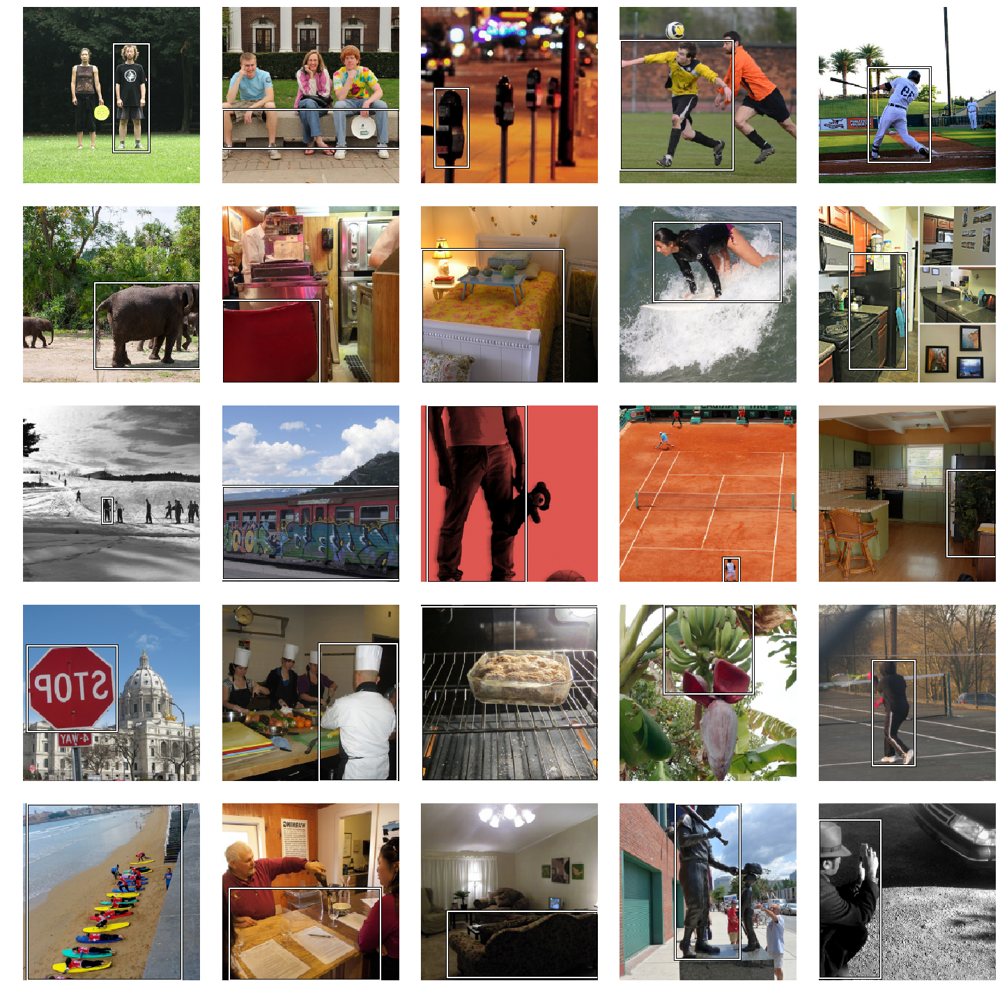

In [33]:
data_img.show_batch(5)

In [12]:
def L1LossFlat(*args, axis:int=-1, floatify:bool=True, **kwargs):
    "Same as `nn.MSELoss`, but flattens input and target."
    return FlattenedLoss(nn.L1Loss, *args, axis=axis, floatify=floatify, is_2d=False, **kwargs)

In [13]:
head = nn.Sequential(Flatten(), nn.Linear(25088,4))
learn = cnn_learner(data_img, models.resnet34, custom_head=head)
learn.loss_func
learn.loss_func = L1LossFlat()

In [36]:
learn.fit_one_cycle(2)

epoch,train_loss,valid_loss,time
0,1.028255,1.711913,29:26
1,0.313447,0.305586,29:07


In [14]:
learn.load('bbox-1')

Learner(data=ImageDataBunch;

Train: LabelList (93813 items)
x: PointsItemList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: SingleBBoxList
ImageBBox (224, 224),ImageBBox (224, 224),ImageBBox (224, 224),ImageBBox (224, 224),ImageBBox (224, 224)
Path: /media/disk6tb/datasets/coco_2017;

Valid: LabelList (23453 items)
x: PointsItemList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: SingleBBoxList
ImageBBox (224, 224),ImageBBox (224, 224),ImageBBox (224, 224),ImageBBox (224, 224),ImageBBox (224, 224)
Path: /media/disk6tb/datasets/coco_2017;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Se

In [15]:
x_val, y_val = get_dataset(data_img.valid_ds)
x_val_data = [x.data for x in x_val]
x_val_ten = torch.stack(x_val_data)
learn.model.eval()
y_pred = learn.model(x_val_ten.cuda())

In [25]:
def plot_test_data(x_val, y_val, pred=False):
    fig, axes = plt.subplots(4, 4, figsize=(24, 24))
    for i,ax in enumerate(axes.flat):
        if pred:
            y = ImageBBox.create(*x_val[i].size, y_pred[i].data.unsqueeze(0).cpu(), scale=False)
        else:
            y = y_val[i]
        x_val[i].show(ax=ax, y=y)

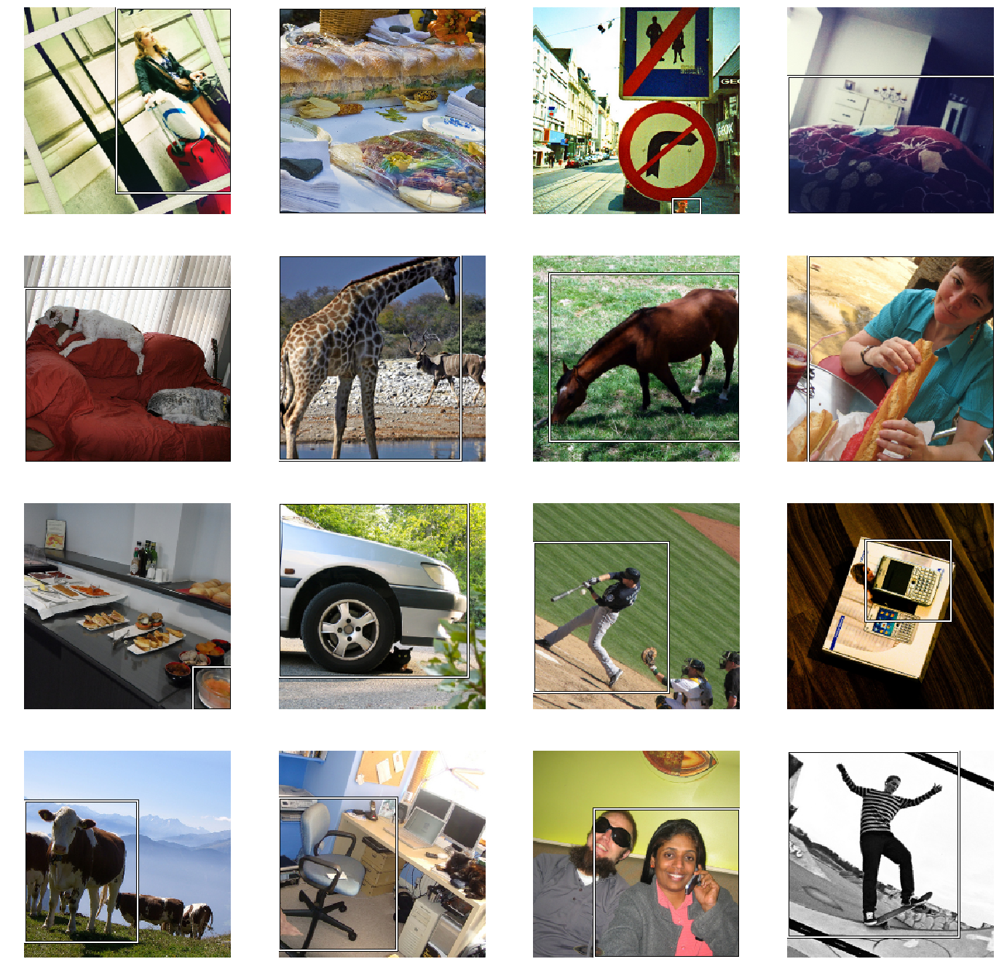

In [26]:
# Plotting the tagged records
plot_test_data(x_val, y_val)

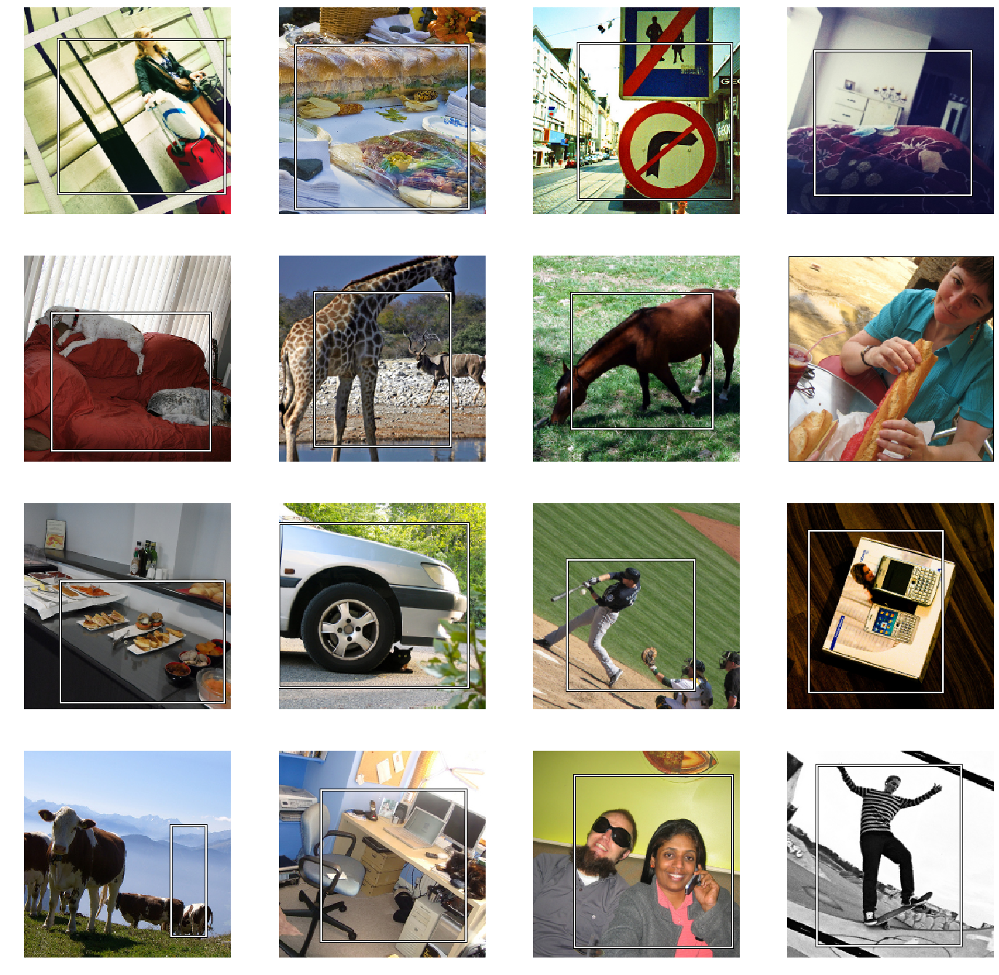

In [28]:
# Plotting the prediction records
plot_test_data(x_val, y_val, True)

# References

* https://forums.fast.ai/t/fixing-code-for-bounding-boxes/32933/6 
* https://forums.fast.ai/t/fixing-code-for-bounding-boxes/32933/6
* https://github.com/radekosmulski/whale/blob/master/fluke_detection_redux.ipynb
* https://github.com/fastai/fastai/blob/master/courses/dl2/pascal.ipynb
* https://forums.fast.ai/t/part-2-lesson-9-wiki/14028
* https://francescopochetti.com/fast-ai-dl2-lesson-9-single-shot-detection-detailed-walkthrough/
* https://github.com/fastai/fastai_docs/blob/master/dev_nb/102a_coco.ipynb

## Datablock references
* https://blog.usejournal.com/finding-data-block-nirvana-a-journey-through-the-fastai-data-block-api-c38210537fe4
* https://github.com/ohmeow/medium-finding-data-block-nirvana
* https://docs.fast.ai/tutorial.itemlist.html

## Related datasets

* https://github.com/radekosmulski/whale/blob/master/fluke_detection_redux.ipynb
* https://github.com/radekosmulski/whale/blob/master/fluke_detection_redux.ipynb
